# Emotion Prediction for Faces in Images

* Method: Detect face(s) in images and predict the emotion of each face.

* Input files: **best.pt** (YOLOv8), **emotion_model.pth** (VGGFace), **test_image** (a folder containing images for testing the combined system), **ARIAL.TTF** (a font file for adjusting the font config of label)

## Requirement

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 915.3/915.3 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO
import cv2
from torchvision import transforms, models
import torch.nn as nn
import torch

from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Load Trained Models

In [ ]:
yolo_model = YOLO("best.pt")

In [ ]:
# Define the same model structure as trained
class VGGFaceEmotion(nn.Module):
    def __init__(self, num_classes=8):
        super(VGGFaceEmotion, self).__init__()
        self.model = models.vgg16(pretrained=True)
        self.model.classifier[6] = nn.Sequential(
            nn.Linear(4096, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.model(x)

# Initialize emotion model
emotion_model = VGGFaceEmotion(num_classes=8)
try:
    emotion_model.load_state_dict(torch.load("emotion_model.pth"))
except:
    emotion_model.load_state_dict(torch.load("emotion_model.pth", map_location=torch.device("cpu")))
emotion_model.eval()

# Define transformations (must match training preprocessing)
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

emotion_classes = ["neutral", "happy", "sad", "surprise", "fear", "disgust", "anger", "contempt"]

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Implement

In [ ]:
def detect_faces_and_emotions(image_path):
    image = cv2.imread(image_path)  # Read image
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    results = yolo_model(image_rgb)  # Run YOLO face detection
    faces = results[0].boxes.xyxy.cpu().numpy()  # Extract bounding boxes

    image_pil = Image.fromarray(image_rgb)  # Convert to PIL
    draw = ImageDraw.Draw(image_pil)
    # font = ImageFont.load_default()
    font = ImageFont.truetype("ARIAL.TTF", 30)

    for box in faces:
        x1, y1, x2, y2 = map(int, box)  # Extract bounding box coords

        # Crop face
        face = image_rgb[y1:y2, x1:x2]
        face_pil = Image.fromarray(face)

        # Preprocess face for VGG
        face_tensor = transform(face_pil).unsqueeze(0)  # Add batch dimension

        # Predict emotion
        with torch.no_grad():
            output = emotion_model(face_tensor)
            predicted_idx = torch.argmax(output).item()
            predicted_emotion = emotion_classes[predicted_idx]

        # Draw bounding box and emotion label
        draw.rectangle([x1, y1, x2, y2], outline="blue", width=5)
        draw.text((x1, y1 - 30), predicted_emotion, fill="red", font=font)

    return image_pil


0: 640x448 1 face, 171.7ms
Speed: 4.2ms preprocess, 171.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)


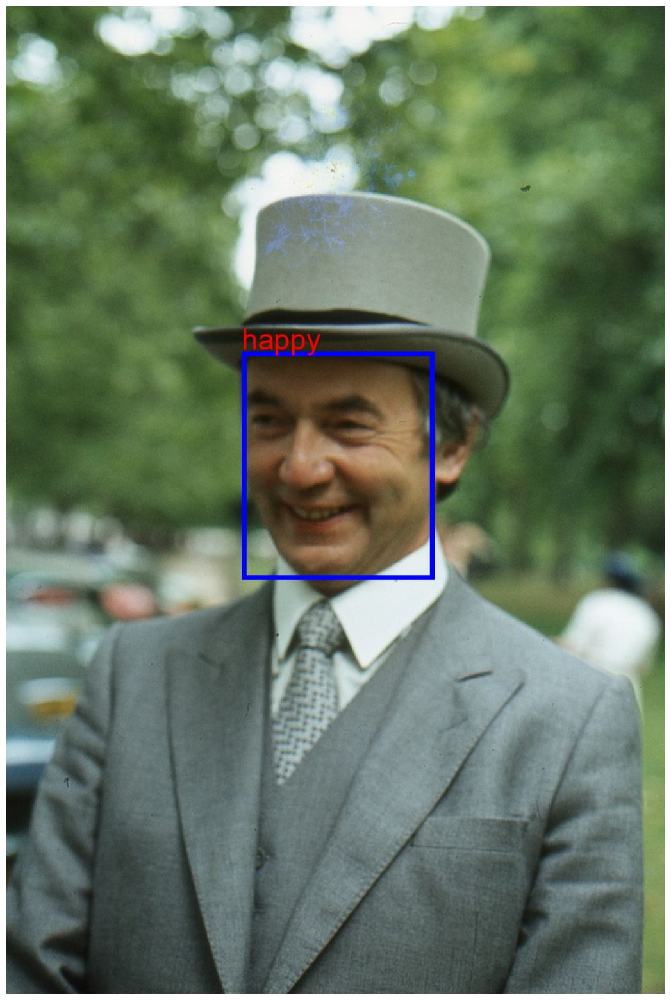


0: 448x640 3 faces, 257.5ms
Speed: 6.1ms preprocess, 257.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


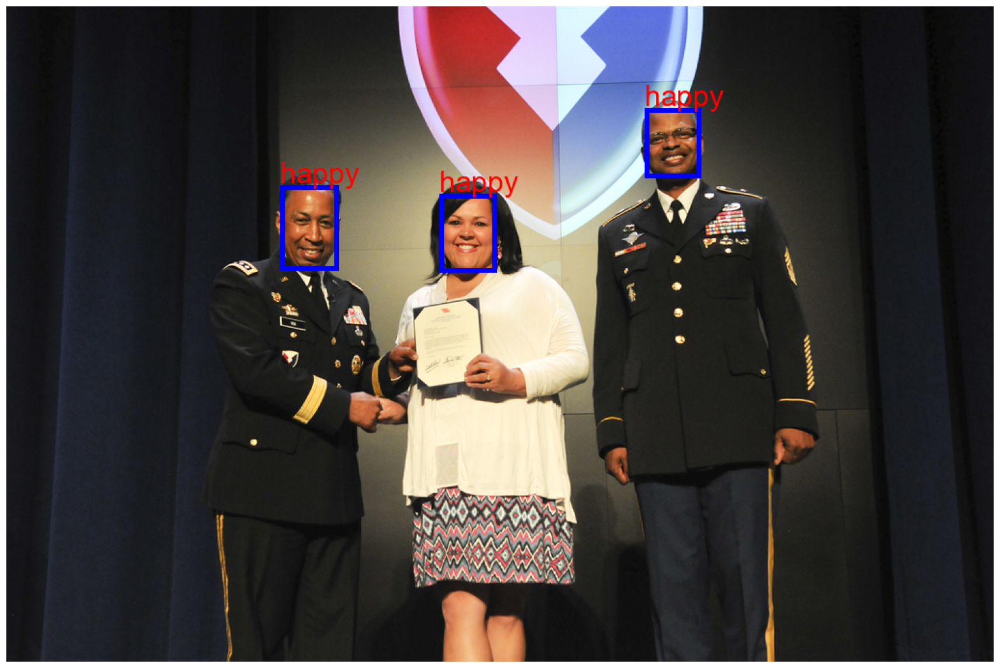


0: 448x640 9 faces, 243.5ms
Speed: 5.2ms preprocess, 243.5ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


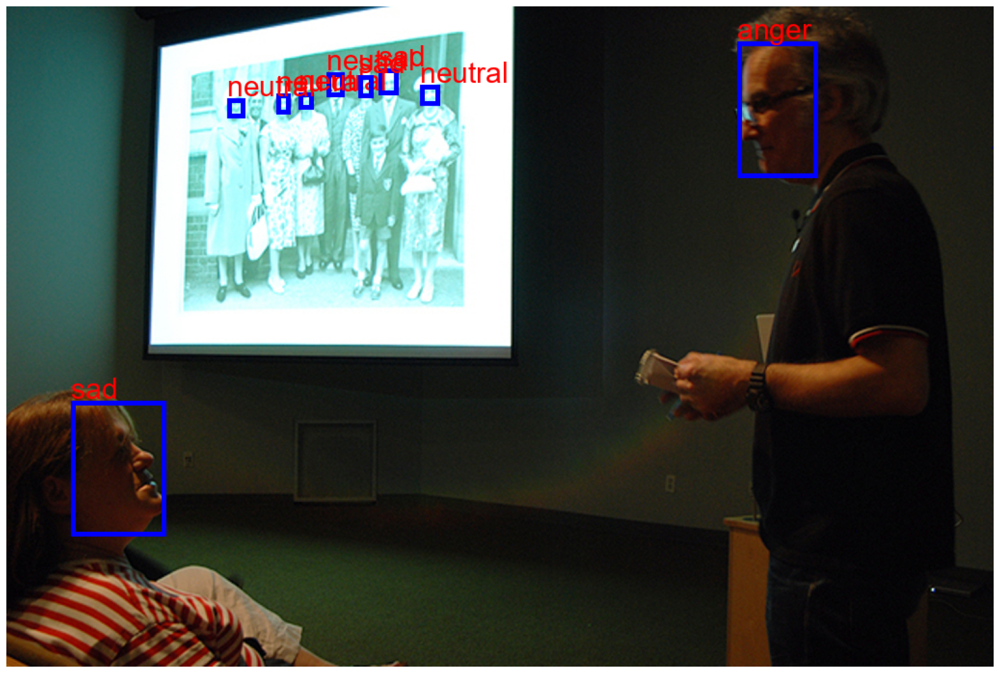


0: 480x640 1 face, 313.0ms
Speed: 5.8ms preprocess, 313.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


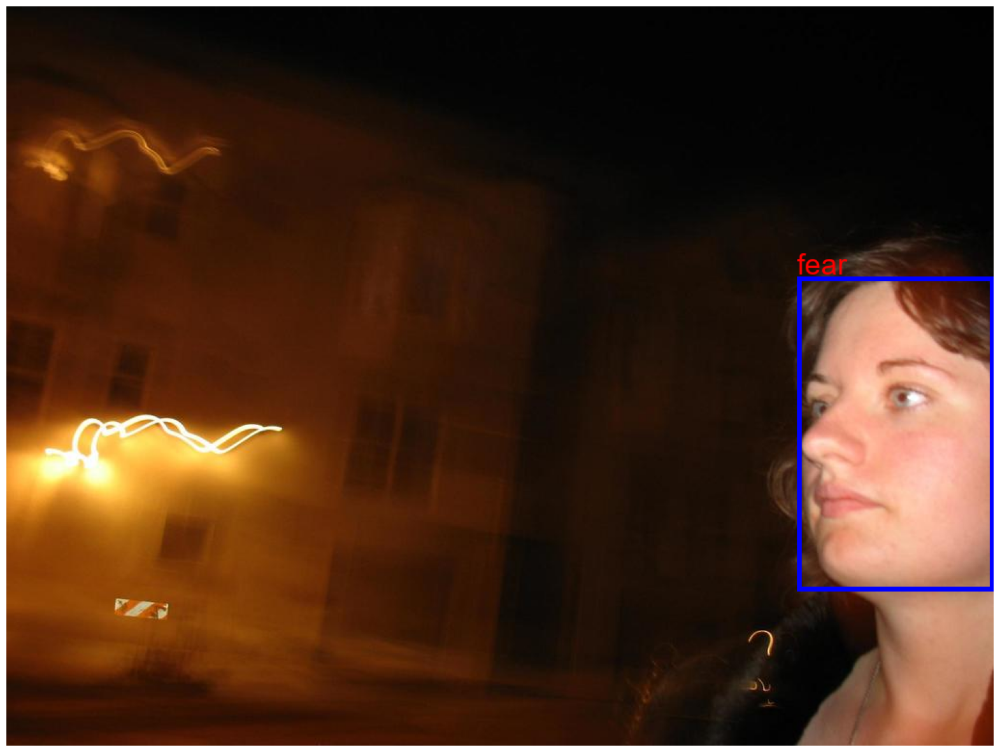


0: 448x640 2 faces, 264.7ms
Speed: 5.8ms preprocess, 264.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


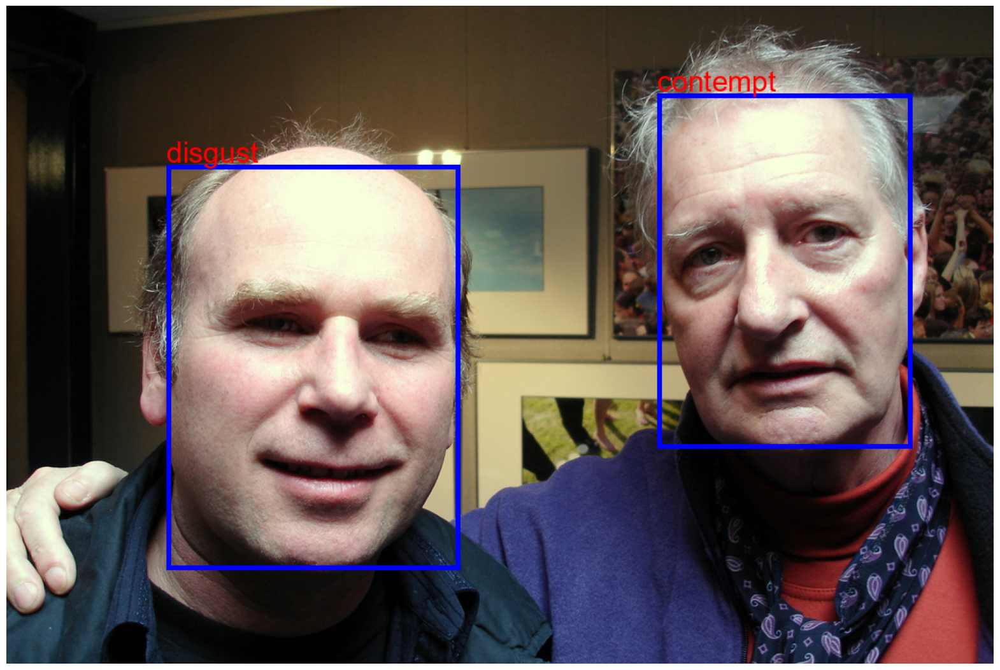

In [ ]:
input_images_folder = "test_image"  # Set this to your images folder

images_shown = 0
num_images = 10

# Process images
for image_name in os.listdir(input_images_folder):
    image_path = os.path.join(input_images_folder, image_name)
    output_image_pil = detect_faces_and_emotions(image_path)

    # Show image with label
    plt.figure(figsize=(20, 20))
    plt.imshow(output_image_pil)
    plt.axis('off')
    plt.show()

    images_shown += 1
    if images_shown >= num_images:
        break  # Stop after displaying num_images